In [93]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import matplotlib.patches as patches
import numpy as np
from scipy import stats

# Objects Detection
The objective is to assess the suitability of the dataset, which has been annotated by a team of image annotators, for training an object detection model. The dataset comprises images with annotations for the following classes:
*  goggles
*  helmet
*  mask
*  no-suit
*  no_goggles
*  no_helmet
*  no_mask
*  no_shoes
*  shoes
*  suit
*  no_glove
*  glove

## Load the data

In [94]:
current_path = os.getcwd()

In [ ]:
from roboflow import Roboflow 
rf = Roboflow(api_key="7dFSpuzZ9tRCorAIDoWH")
project = rf.workspace("personal-protective-equipment").project("ppes-kaxsi")
dataset = project.version(4).download("tensorflow")

In [96]:
train_path = os.path.join(current_path, 'PPEs-4/train')
val_path = os.path.join(current_path, 'PPEs-4/valid')

In [97]:
train_files = os.listdir(train_path)
val_files = os.listdir(val_path)

In [98]:
addnoations = [file for file in train_files if not file.lower().endswith('.jpg')]

In [99]:
addnoations

['_annotations.csv']

In [100]:
train_annotations = os.path.join(train_path, addnoations[0])
val_annotations = os.path.join(val_path, addnoations[0])

train_df = pd.read_csv(train_annotations)
val_df = pd.read_csv(val_annotations)

In [101]:
train_df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,kp1737_jpg.rf.78a83ac82adaa308fa023354c4d091a4...,1280,720,no_goggles,509,541,582,576
1,packing1020_jpg.rf.7949b2c00e93d76df0fe29034dc...,1280,720,no_goggles,934,246,1003,279
2,packing1020_jpg.rf.7949b2c00e93d76df0fe29034dc...,1280,720,no_goggles,183,249,239,278
3,packing1020_jpg.rf.7949b2c00e93d76df0fe29034dc...,1280,720,no_goggles,840,469,966,519
4,img273_jpg.rf.78e6836c24c899b455bb6079eb65ae34...,1280,720,glove,153,314,307,427


## EDA

In [141]:
def display_sample_images(df, class_name, num_samples=3):
    class_df = df[df['class'] == class_name]
    sample_filenames = class_df['filename'].sample(num_samples)
    
    image_dir = train_path  
    
    plt.figure(figsize=(12, 4))
    for i, filename in enumerate(sample_filenames):
        img_path = os.path.join(image_dir, filename)
        img = plt.imread(img_path)
        
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img)
        plt.title(f'Sample {i + 1}')
        plt.axis('off')
    
    plt.suptitle(f'Class: {class_name}', fontsize=16)
    plt.show()
    
def display_sample_images_with_boxes(df, class_name, image_dir, num_samples=3):
    class_df = train_df[train_df['class'] == class_name]
    sample_rows = class_df.sample(num_samples)
    
    plt.figure(figsize=(12, 4))
    for i, row in enumerate(sample_rows.itertuples()):
        img_path = os.path.join(image_dir, row.filename)
        img = plt.imread(img_path)
        
        ax = plt.subplot(1, num_samples, i + 1)
        plt.imshow(img)
        plt.title(f'Sample {i + 1}')
        plt.axis('off')
        
        # Draw bounding boxes on the image
        xmin, ymin, xmax, ymax = row.xmin, row.ymin, row.xmax, row.ymax
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, 
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
    
    plt.suptitle(f'Class: {class_name}', fontsize=16)
    plt.show()

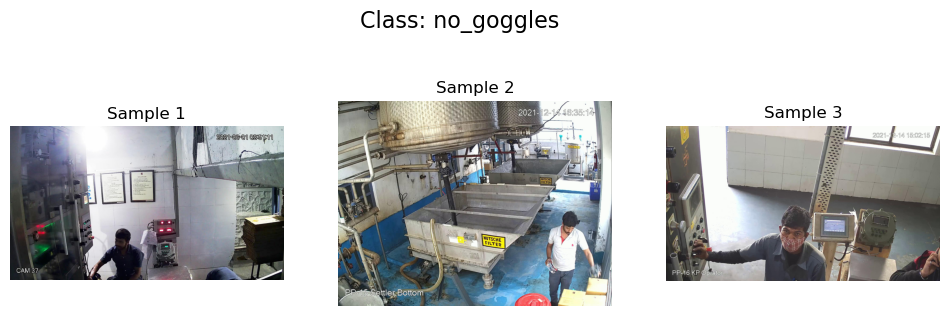

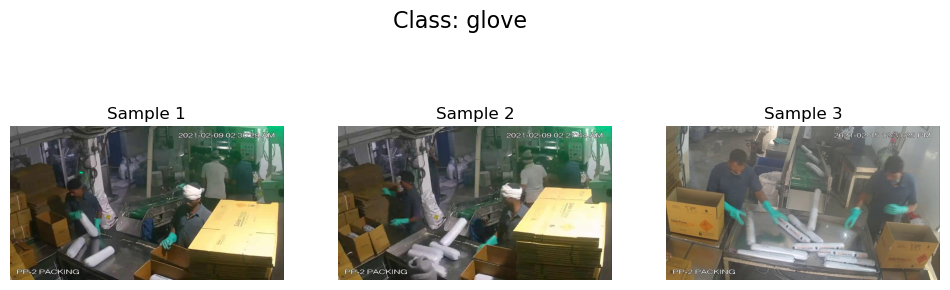

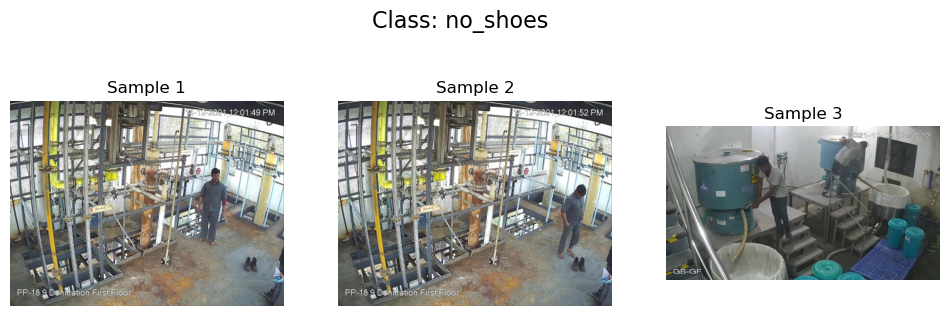

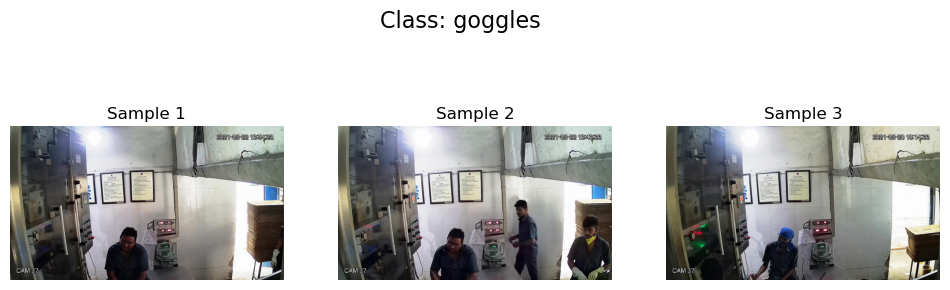

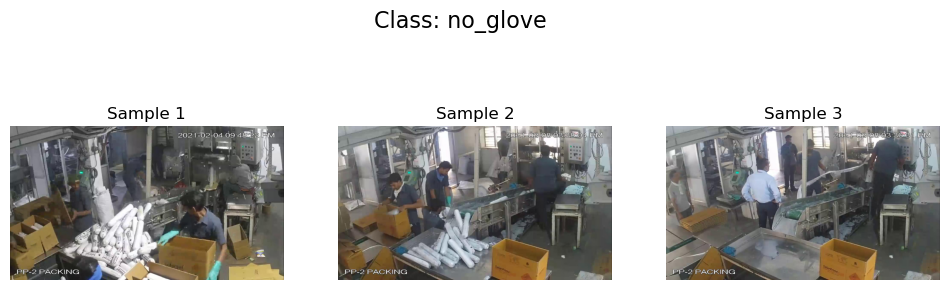

...

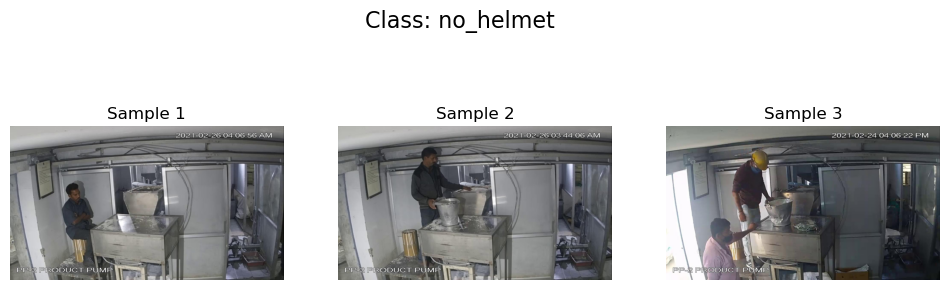

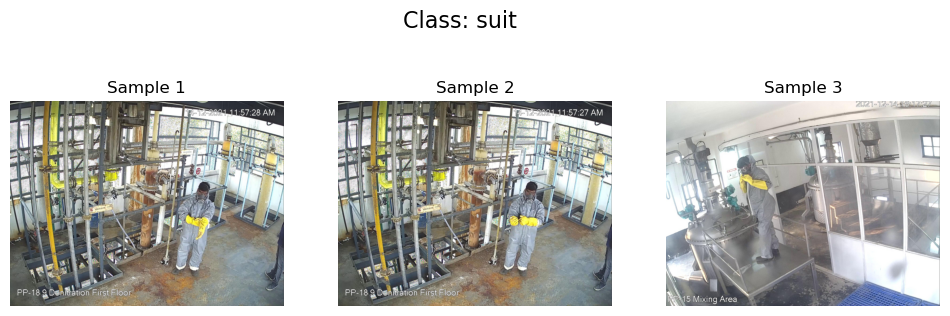

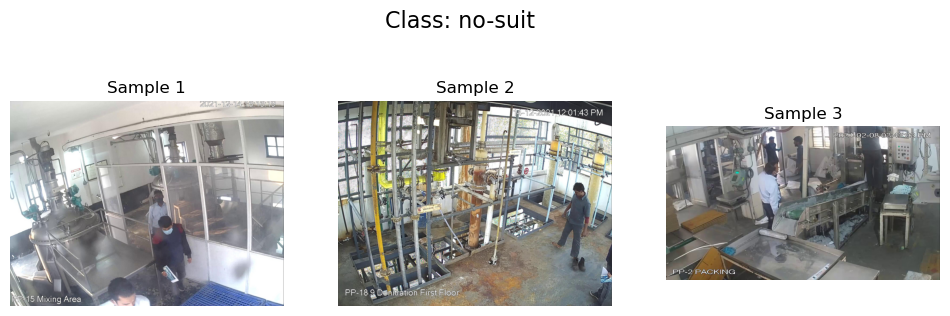

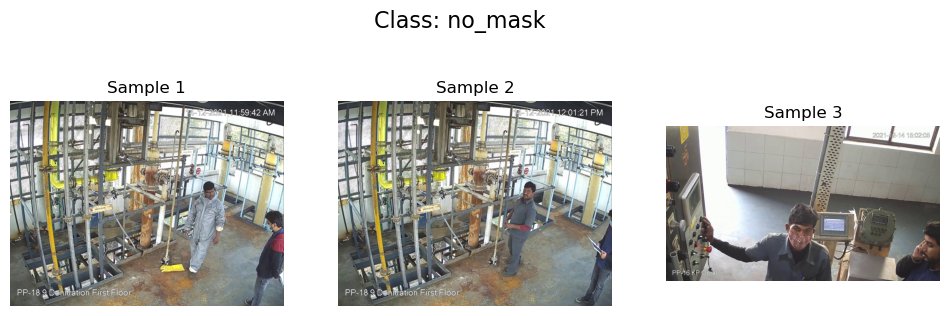

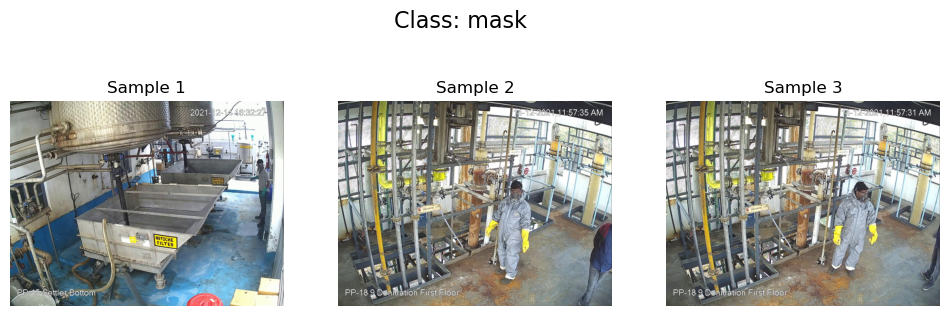

In [140]:
unique_classes = train_df['class'].unique()

# Display sample images for each class
for class_name in unique_classes:
    display_sample_images(train_df, class_name)

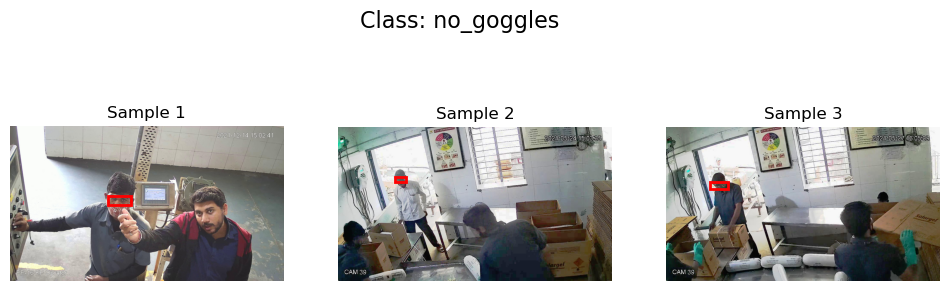

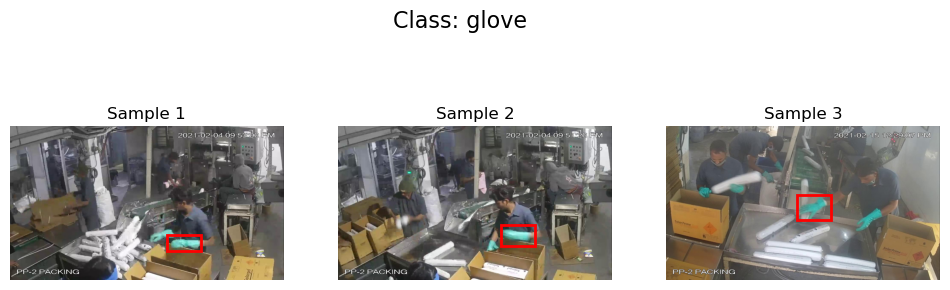

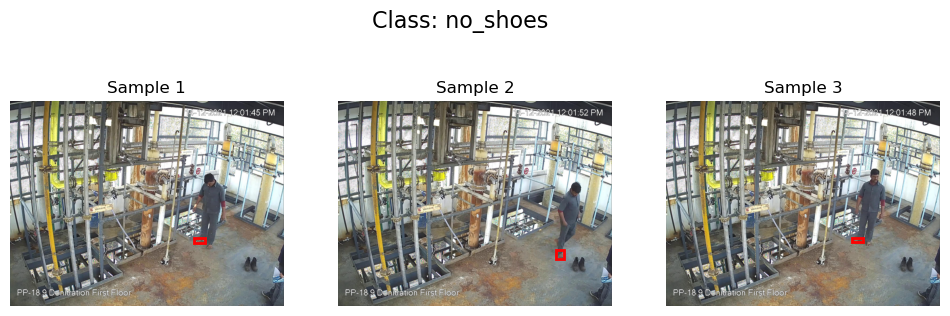

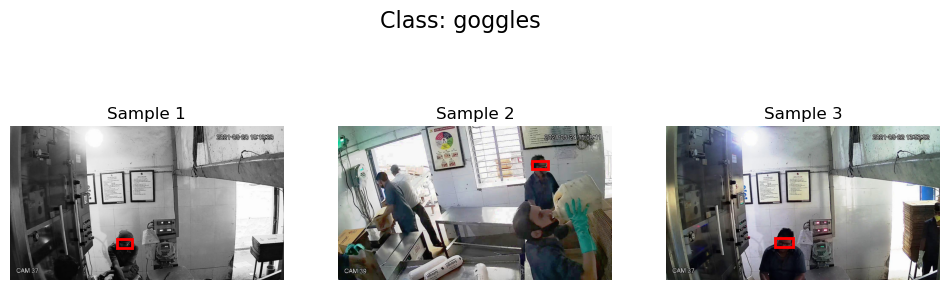

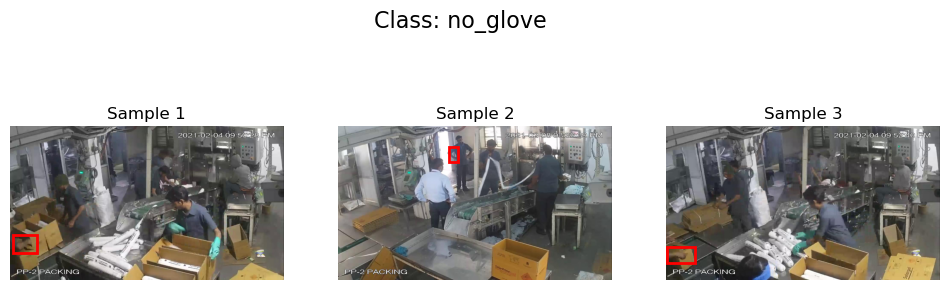

...

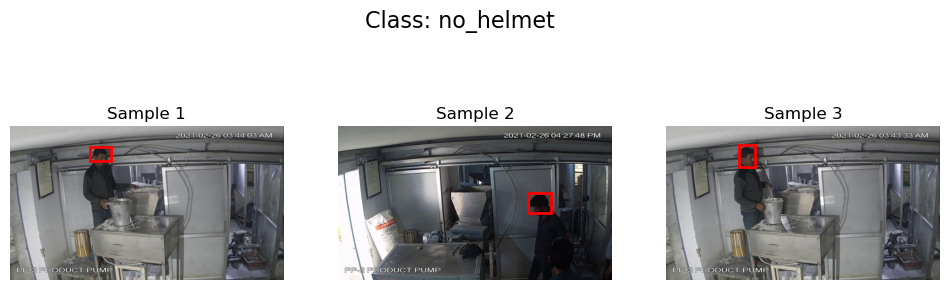

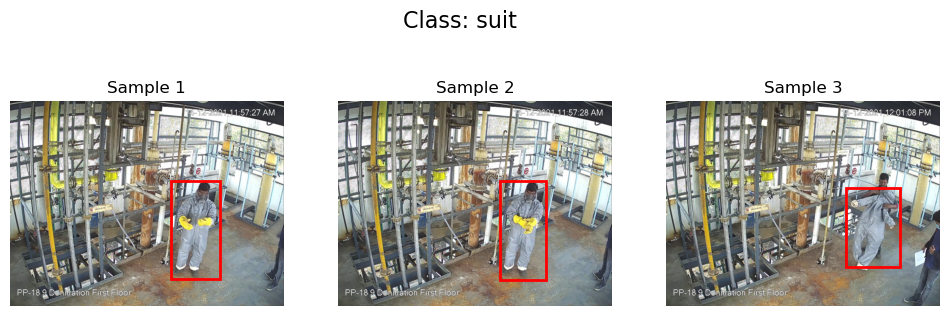

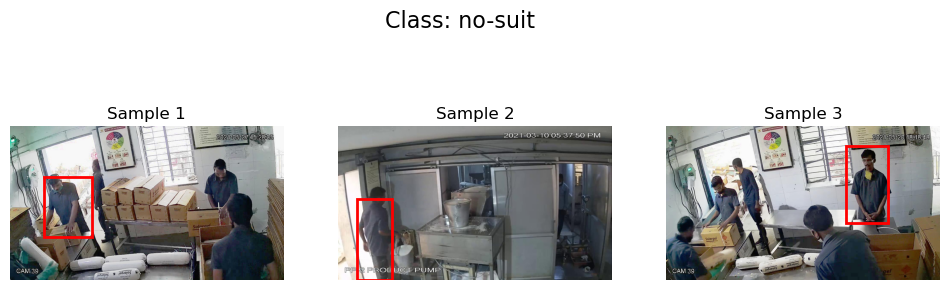

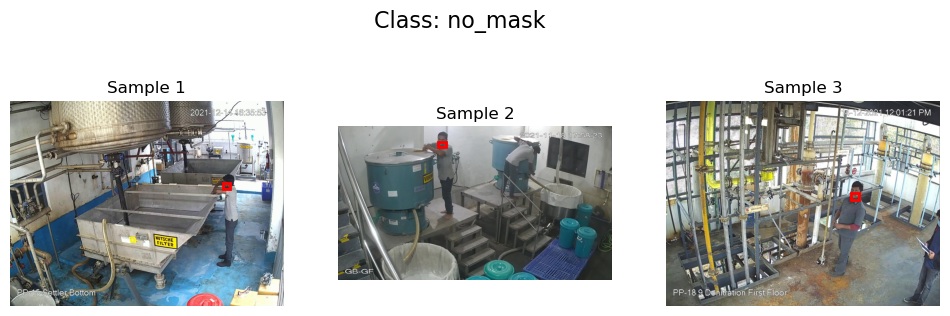

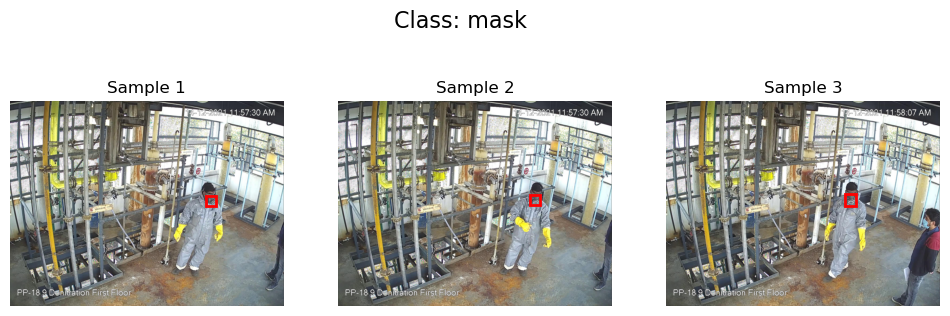

In [142]:
# Display sample images with bounding boxes for each class
for class_name in unique_classes:
    display_sample_images_with_boxes(train_df, class_name, train_path)

### Insight into images
The dataset displays a significant variance in the background scenarios depicted in the images. While some instances show a commonality in backgrounds, others present entirely distinct ones. This diversity is advantageous as it contributes to the model's ability to distinguish relevant objects regardless of varying backgrounds, enhancing its adaptability and reliability in diverse real-world situations.

**Image Quality:**
A wide range of image qualities is evident within the dataset, with some images being sharp and rich in detail, and others appearing blurred. This inconsistency necessitates a thorough preprocessing strategy to ensure the model can generalize well across different levels of image clarity and quality.

In [102]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19688 entries, 0 to 19687
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  19688 non-null  object
 1   width     19688 non-null  int64 
 2   height    19688 non-null  int64 
 3   class     19688 non-null  object
 4   xmin      19688 non-null  int64 
 5   ymin      19688 non-null  int64 
 6   xmax      19688 non-null  int64 
 7   ymax      19688 non-null  int64 
dtypes: int64(6), object(2)
memory usage: 1.2+ MB


In [103]:
val_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4889 entries, 0 to 4888
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  4889 non-null   object
 1   width     4889 non-null   int64 
 2   height    4889 non-null   int64 
 3   class     4889 non-null   object
 4   xmin      4889 non-null   int64 
 5   ymin      4889 non-null   int64 
 6   xmax      4889 non-null   int64 
 7   ymax      4889 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 305.7+ KB


In [104]:
4889/(4889+19687)

0.19893391927083334

The validation set comprises approximately 20% of the entire dataset.

In [105]:
train_df.isna().sum()

filename    0
width       0
height      0
class       0
xmin        0
ymin        0
xmax        0
ymax        0
dtype: int64

In [106]:
val_df.isna().sum()

filename    0
width       0
height      0
class       0
xmin        0
ymin        0
xmax        0
ymax        0
dtype: int64

There are no missing values.

In [107]:
train_df.describe()

,width,height,xmin,ymin,xmax,ymax
count,19688.000000,19688.000000,19688.000000,19688.000000,19688.000000,19688.000000
mean,1399.830049,842.739537,690.992838,387.544139,788.431887,476.399685
std,384.822919,317.136392,480.829407,267.112682,486.993030,291.707706
min,200.000000,199.000000,1.000000,1.000000,13.000000,24.000000
25%,1280.000000,720.000000,305.000000,194.000000,402.000000,265.000000
50%,1280.000000,720.000000,519.000000,332.000000,610.000000,441.000000
75%,1280.000000,720.000000,946.000000,509.000000,1037.000000,567.000000
max,2688.000000,1536.000000,2576.000000,1433.000000,2688.000000,1535.000000


### Class distribution

In [108]:
train_df_sorted = train_df.sort_values(by='class')
val_df_sorted = val_df.sort_values(by='class')

In [109]:
def plot_class_distribution(data_df, title, ax):
    sns.countplot(data=data_df, x='class', palette='viridis', ax=ax)
    ax.set_xlabel('Class')
    ax.set_ylabel('Count')
    ax.set_title(title)
    ax.tick_params(axis='x', rotation=45)

    # Number values of class
    for p in ax.patches:
        ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='baseline', fontsize=12, color='black', xytext=(0, 5),
                    textcoords='offset points')

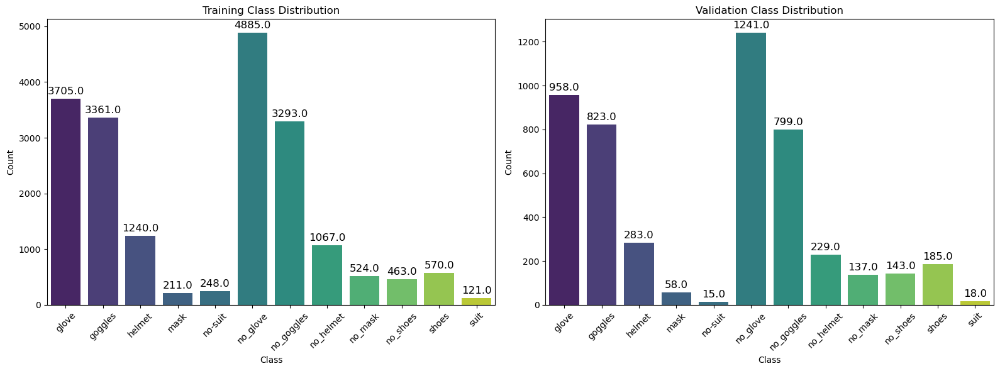

In [110]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))  # 1 row, 2 columns

# Plot class distribution for training data
plot_class_distribution(train_df_sorted, 'Training Class Distribution', ax=axes[0])

# Plot class distribution for validation data
plot_class_distribution(val_df_sorted, 'Validation Class Distribution', ax=axes[1])

plt.tight_layout()
plt.show()

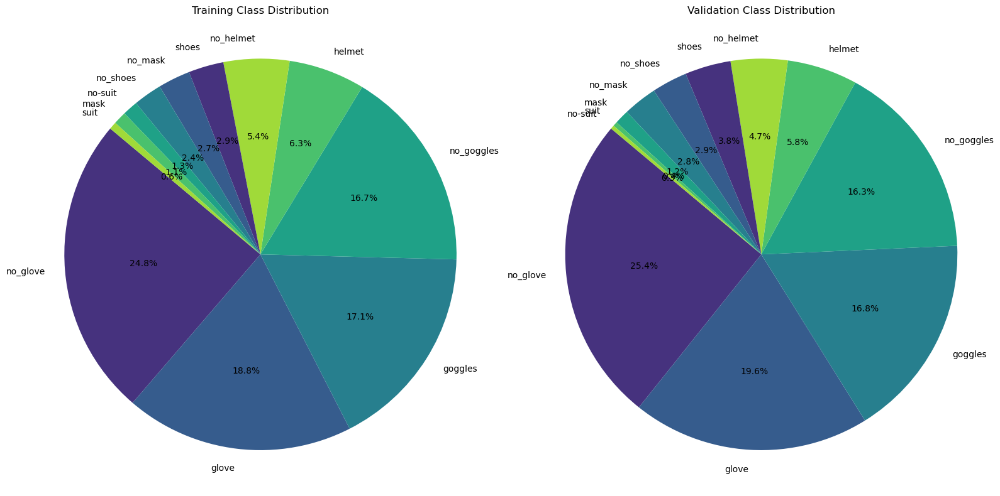

In [111]:
class_counts = {
    'Training': train_df['class'].value_counts(),
    'Validation': val_df['class'].value_counts()
}
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

for i, (split, counts) in enumerate(class_counts.items()):
    # Plot the pie chart
    axes[i].pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('viridis'))
    axes[i].set_title(f'{split} Class Distribution')
    axes[i].axis('equal') 

plt.tight_layout()
plt.show()

### Class Imbalance and Distribution:

The dataset manifests a notable class imbalance, with distinct class distributions observable between the training and validation sets. 

#### Training Set:
- **Majority Class:** `no_glove`
  - **Occurrences:** 4885
  - **Proportion:** ~25% of the data
- **Minority Class:** `suit`
  - **Occurrences:** 121
  
#### Validation Set:
- **Majority Class:** `no_glove`
  - **Occurrences:** 121
  - **Proportion:** ~25% of the data
- **Minority Class:** `non-suit`
  - **Occurrences:** 15

#### Considerations:
This imbalance in class distribution requiers strategic intervention during the model training phase to negate biases towards the majority class and to ensure the model is proficient in generalizing across all classes. Techniques such as resampling, data augmentation*, or modifying class weights during training should be contemplated to counter the effects of class imbalance.

*When employing techniques like resampling or data augmentation, it is crucial to consider the bounding boxes associated with objects in images. This ensures the integrity of object localization and detection, allowing the model to learn the correct spatial features and relationships in augmented or resampled data.

In [112]:
# Calculate aspect ratios (width / height) for each image
train_df['aspect_ratio'] = train_df['width'] / train_df['height']
val_df['aspect_ratio'] = val_df['width'] / val_df['height']

In [113]:
def plot_aspect_ratio_distribution(data_df, color='skyblue', title='Image Size Distribution'):
    plt.figure(figsize=(10, 6))
    sns.histplot(data=data_df, x='aspect_ratio', bins=20, kde=True, color=color)
    plt.xlabel('Aspect Ratio (Width / Height)')
    plt.ylabel('Frequency')
    plt.title(title)
    plt.grid(True)
    plt.show()

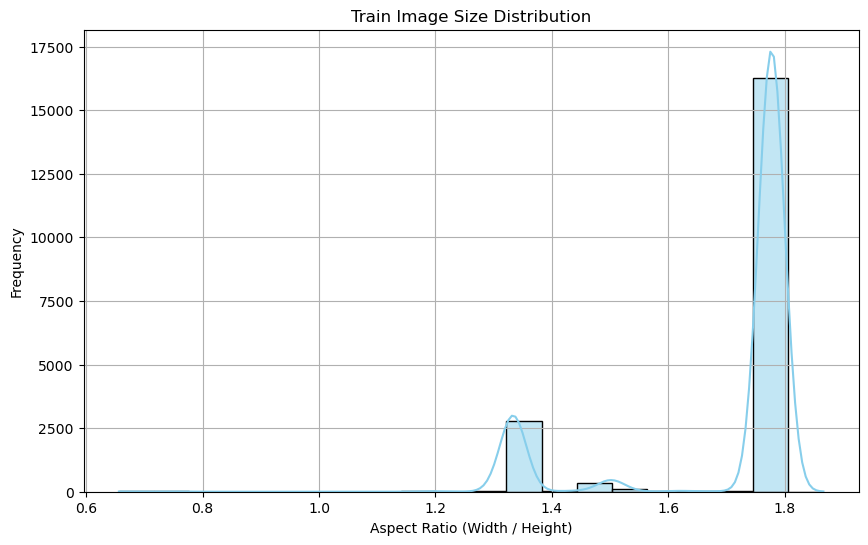

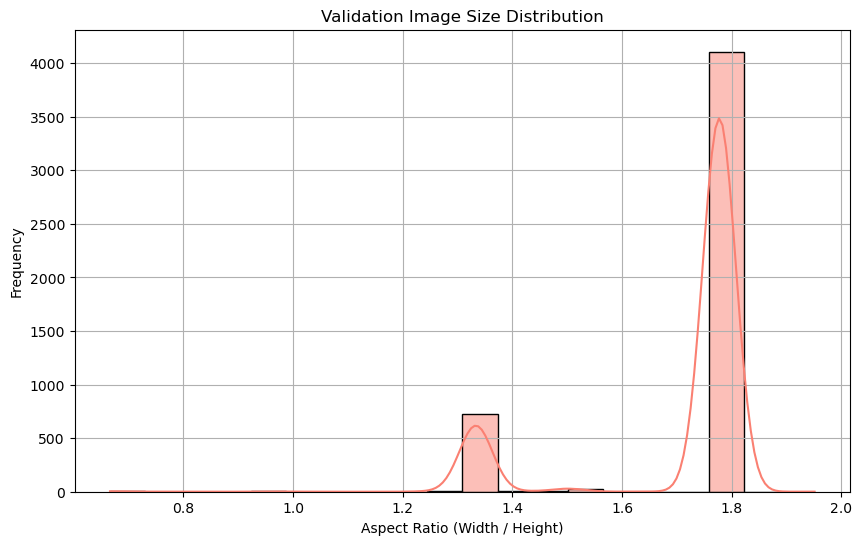

In [114]:
plot_aspect_ratio_distribution(train_df, color='skyblue', title='Train Image Size Distribution')
plot_aspect_ratio_distribution(val_df, color='salmon', title='Validation Image Size Distribution')

In [115]:
# Z-scores for the aspect ratios
z_scores = np.abs(stats.zscore(train_df['aspect_ratio']))
threshold = 3
# Identifying outliers
outlier_mask = z_scores > threshold
outliers_df = train_df[outlier_mask]

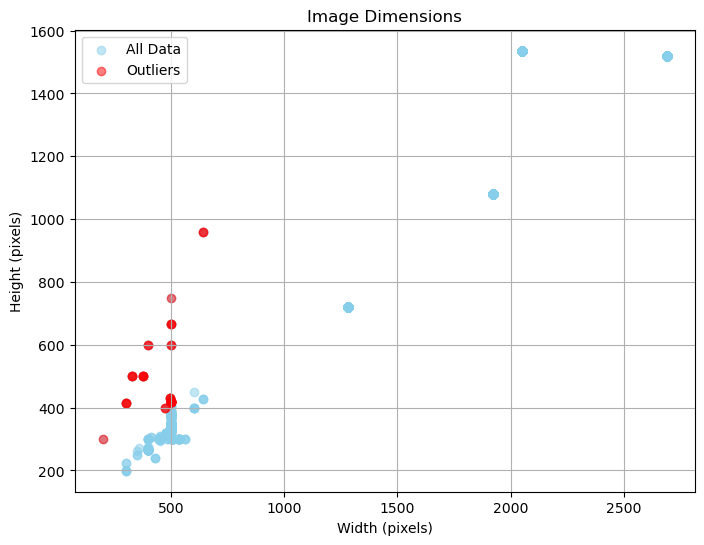

,filename,width,height,class,xmin,ymin,xmax,ymax,aspect_ratio
2054,005520_jpg.rf.9301c318215282f510b679d3871e63ed...,640,959,helmet,244,279,314,334,0.667362
2055,005520_jpg.rf.9301c318215282f510b679d3871e63ed...,640,959,helmet,369,280,436,337,0.667362
8082,005304_jpg.rf.08cc54741e324b81dffdc573bd69543f...,375,500,helmet,26,157,122,239,0.750000
8083,005304_jpg.rf.08cc54741e324b81dffdc573bd69543f...,375,500,helmet,228,156,370,252,0.750000
8084,005304_jpg.rf.08cc54741e324b81dffdc573bd69543f...,375,500,helmet,203,104,316,180,0.750000
8085,005304_jpg.rf.08cc54741e324b81dffdc573bd69543f...,375,500,helmet,124,182,206,253,0.750000
12534,005542_jpg.rf.e1696eac50ddf562dee6e792c8aec2e5...,500,599,helmet,33,203,141,275,0.834725
12535,005542_jpg.rf.e1696eac50ddf562dee6e792c8aec2e5...,500,599,helmet,265,33,365,180,0.834725
12629,005459_jpg.rf.e2e1df83290dad9cbf5bf5e0b1184251...,328,500,helmet,260,280,327,350,0.656000
12630,005459_jpg.rf.e2e1df83290dad9cbf5bf5e0b1184251...,328,500,helmet,139,270,171,296,0.656000


In [161]:
# Plot the dimensions of images
plt.figure(figsize=(8, 6))
plt.scatter(train_df['width'], train_df['height'], color='skyblue', alpha=0.5, label='All Data')
plt.scatter(outliers_df['width'], outliers_df['height'], color='red', alpha=0.7, label='Outliers')
plt.xlabel('Width (pixels)')
plt.ylabel('Height (pixels)')
plt.title('Image Dimensions')
plt.legend()
plt.grid(True)
plt.show()

outliers_df

In [117]:
outlier_counts_by_class = outliers_df.groupby('class').size().reset_index(name='outlier_count')

In [118]:
print("Outliers by Class:")
print(outlier_counts_by_class)

Outliers by Class:
       class  outlier_count
0     helmet             28
1  no_helmet             12


In [119]:
image_size = ['width', 'height']

for column in image_size:
    counts = Counter(train_df[column])
    
    for width, count in counts.items():
        print(f"{column, width}: Count {count}")

('width', 1280): Count 15562
('width', 1920): Count 148
('width', 2048): Count 2702
('width', 2688): Count 546
('width', 500): Count 526
('width', 450): Count 25
('width', 534): Count 16
('width', 400): Count 49
('width', 640): Count 5
('width', 533): Count 2
('width', 502): Count 8
('width', 480): Count 11
('width', 300): Count 9
('width', 499): Count 3
('width', 410): Count 2
('width', 350): Count 3
('width', 399): Count 2
('width', 490): Count 14
('width', 375): Count 4
('width', 431): Count 3
('width', 328): Count 3
('width', 509): Count 6
('width', 401): Count 12
('width', 475): Count 2
('width', 600): Count 7
('width', 451): Count 1
('width', 496): Count 3
('width', 359): Count 1
('width', 444): Count 1
('width', 560): Count 3
('width', 449): Count 2
('width', 508): Count 4
('width', 482): Count 2
('width', 200): Count 1
('height', 720): Count 15562
('height', 1080): Count 148
('height', 1536): Count 2702
('height', 1520): Count 546
('height', 368): Count 6
('height', 333): Count

In [121]:
train_df[image_size[0]].describe()

count    19688.000000
mean      1399.830049
std        384.822919
min        200.000000
25%       1280.000000
50%       1280.000000
75%       1280.000000
max       2688.000000
Name: width, dtype: float64

In [123]:
train_df[image_size[1]].describe()

count    19688.000000
mean       842.739537
std        317.136392
min        199.000000
25%        720.000000
50%        720.000000
75%        720.000000
max       1536.000000
Name: height, dtype: float64

### Image Size and Class Association:

Images exhibiting aspect ratios that deviate from the norm are distinctly related to the `helmet` or `no_helmet` classes. 

- There are 28 outlier instances within the `helmet` class.
- There are 12 outlier instances within the `no_helmet` class.

#### Size Range:
The dimensions of the images in the dataset have a considerable range, with:
- Minimum size: 200x199 pixels
- Maximum size: 2688x1536 pixels

The mean size of images is around 1400x843.

#### Inferences:
Most of the images exhibit a similar aspect ratio. Only a few samples deviate from the predominant size. The images with distinctive aspect ratios predominantly belong to the `helmet` or `no_helmet` classes. Consequently, if the images diverging in size are deleted and undersampling is subsequently performed on data with an aspect ratio of 1.0, the number of images across these classes will remain consistent.

In [41]:
# Bounding Boxes per Image
bbox_counts = train_df.groupby('filename').size().reset_index(name='bbox_count')

In [43]:
summary_stats = bbox_counts.describe()

summary_stats

,bbox_count
count,9611.000000
mean,2.048486
std,1.420139
min,1.000000
25%,1.000000
50%,1.000000
75%,3.000000
max,13.000000


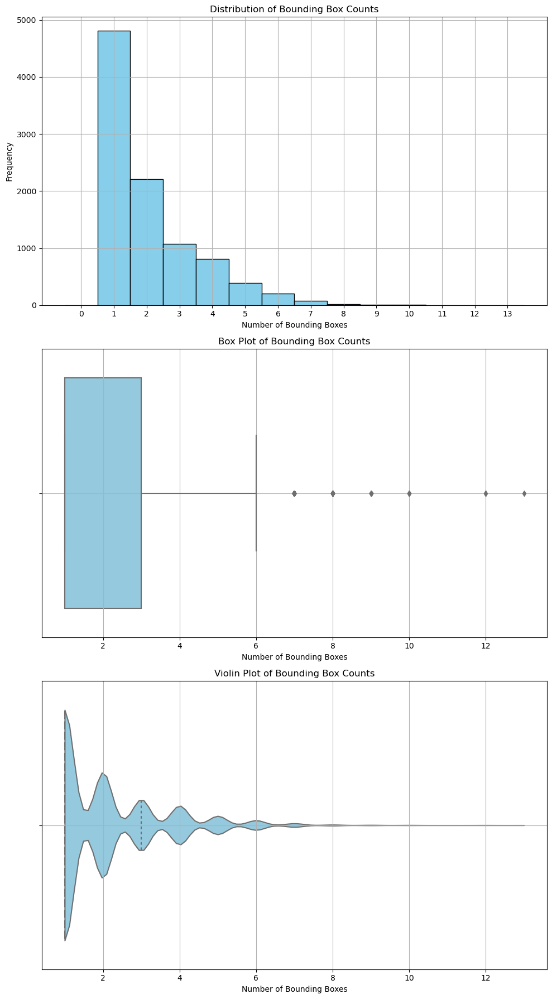

In [128]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 18))

# Histogram
axes[0].hist(bbox_counts['bbox_count'], bins=bins, edgecolor='k', color='skyblue')
axes[0].set_xlabel('Number of Bounding Boxes')
axes[0].set_ylabel('Frequency')
axes[0].set_title('Distribution of Bounding Box Counts')
axes[0].grid(True)
axes[0].set_xticks(range(bbox_counts['bbox_count'].max() + 1))

# Box Plot
sns.boxplot(x=bbox_counts['bbox_count'], ax=axes[1], color='skyblue')
axes[1].set_xlabel('Number of Bounding Boxes')
axes[1].set_title('Box Plot of Bounding Box Counts')
axes[1].grid(True)

# Violin Plot
sns.violinplot(x=bbox_counts['bbox_count'], inner='quart', cut=0, ax=axes[2], color='skyblue')
axes[2].set_xlabel('Number of Bounding Boxes')
axes[2].set_title('Violin Plot of Bounding Box Counts')
axes[2].grid(True)

plt.tight_layout()
plt.show()

### Number of Bounding Boxes per Image

The analysis of the dataset reveals that a predominant number of images are annotated with a single bounding box, indicating the presence of only one object of interest in most images. However, it's noteworthy that there exist images with a considerable number of bounding boxes, extending up to 13. This implies a varied degree of object interactions, occlusions, and contextual relationships within some images in the dataset. Such diversity can be instrumental in enhancing the model's ability to discern and localize multiple objects in complex scenes and adapt to varied real-world scenarios.


In [131]:
# Box sizes
train_df['box_width'] = train_df['xmax'] - train_df['xmin']
train_df['box_height'] = train_df['ymax'] - train_df['ymin']

In [132]:
box_width_stats = train_df['box_width'].describe()
box_height_stats = train_df['box_height'].describe()

In [133]:
box_width_stats

count    19688.000000
mean        97.439049
std         48.499630
min         11.000000
25%         71.000000
50%         85.000000
75%        111.000000
max        402.000000
Name: box_width, dtype: float64

In [134]:
box_height_stats

count    19688.000000
mean        88.855547
std         87.200182
min         12.000000
25%         40.000000
50%         73.000000
75%        111.000000
max        825.000000
Name: box_height, dtype: float64

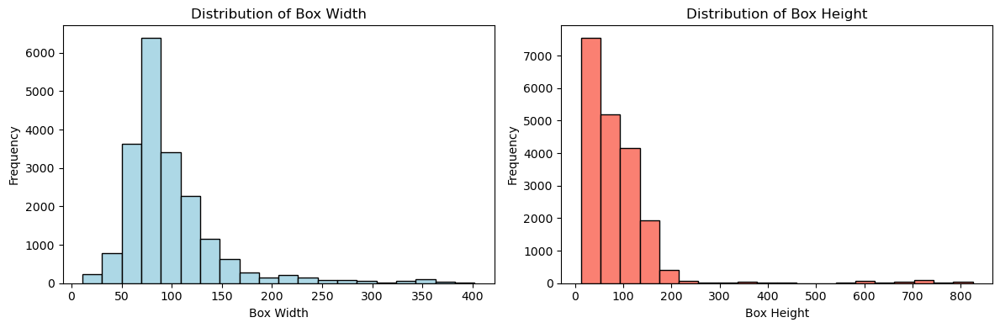

In [138]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.hist(train_df['box_width'], bins=20, color='lightblue', edgecolor='k')
plt.xlabel('Box Width')
plt.ylabel('Frequency')
plt.title('Distribution of Box Width')

plt.subplot(1, 2, 2)
plt.hist(train_df['box_height'], bins=20, color='salmon', edgecolor='k')
plt.xlabel('Box Height')
plt.ylabel('Frequency')
plt.title('Distribution of Box Height')

plt.tight_layout()
plt.show()

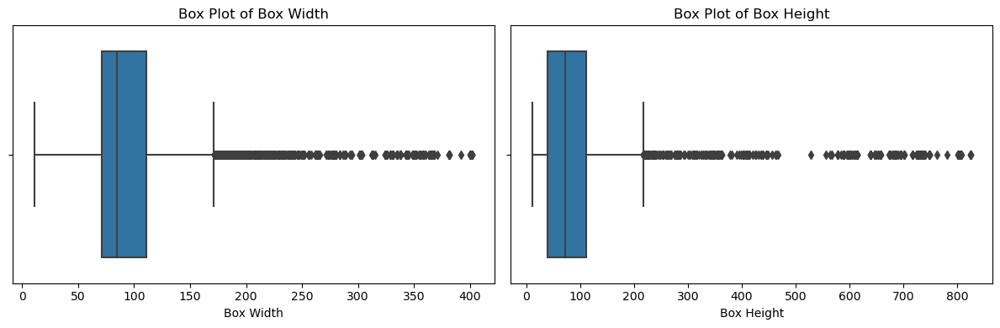

In [54]:
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.boxplot(x=train_df['box_width'])
plt.xlabel('Box Width')
plt.title('Box Plot of Box Width')

plt.subplot(1, 2, 2)
sns.boxplot(x=train_df['box_height'])
plt.xlabel('Box Height')
plt.title('Box Plot of Box Height')

plt.tight_layout()
plt.show()

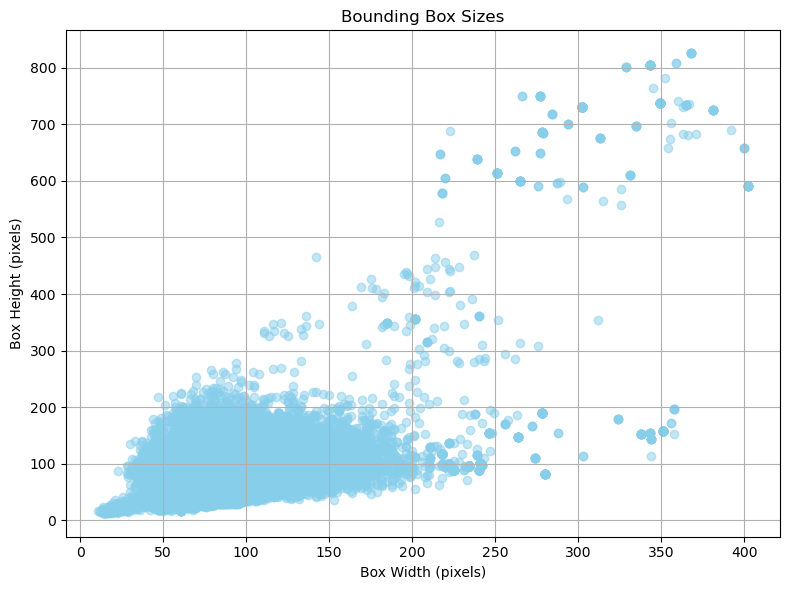

In [59]:
# Plot for box sizes
plt.figure(figsize=(8, 6))
plt.scatter(train_df['box_width'], train_df['box_height'], color='skyblue', alpha=0.5)
plt.xlabel('Box Width (pixels)')
plt.ylabel('Box Height (pixels)')
plt.title('Bounding Box Sizes')

plt.grid(True)

plt.tight_layout()
plt.show()

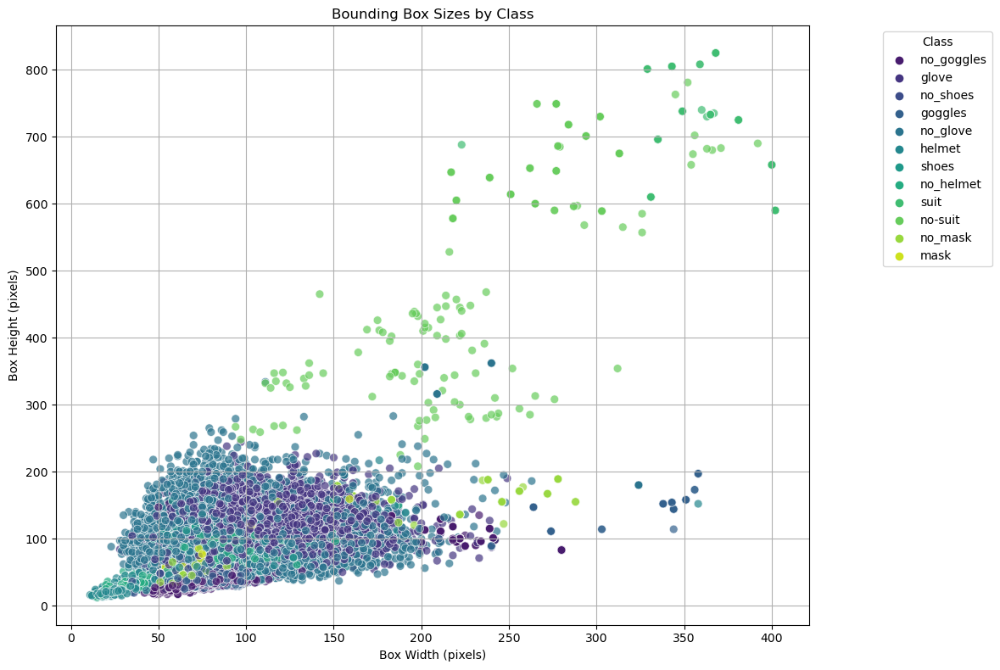

In [60]:
# Plot for box sizes with class labels as colors
plt.figure(figsize=(12, 8))
sns.scatterplot(x='box_width', y='box_height', hue='class', data=train_df, palette='viridis', alpha=0.7, s=50)
plt.xlabel('Box Width (pixels)')
plt.ylabel('Box Height (pixels)')
plt.title('Bounding Box Sizes by Class')

plt.grid(True)

plt.legend(title='Class', loc='upper right', bbox_to_anchor=(1.25, 1))

plt.tight_layout()
plt.show()

### Conclusion on Bounding Box Sizes

The examination of bounding box dimensions provides significant insights into the commonality and variations among the objects within the dataset.

#### Bounding Box Width and Height:
- The visual representation of box width demonstrates a clear clustering of values, indicating that most objects have a similar width.
- Similarly, the depiction of box height presents distinct clustering, suggesting a predominant similarity in the height of the objects.

In conclusion, the majority of the bounding boxes exhibit a comparable size range, emphasizing the prevalent similarity in the dimensions of objects within the dataset. Nevertheless, there are instances with notably diverse bounding box sizes, ensuring the model is exposed to a variety of object scales, contributing to its ability to generalize and adapt to different scenarios effectively.

In [145]:
# Calculate Box Center (X, Y)
train_df['box_center_x'] = (train_df['xmin'] + train_df['xmax']) / 2
train_df['box_center_y'] = (train_df['ymin'] + train_df['ymax']) / 2

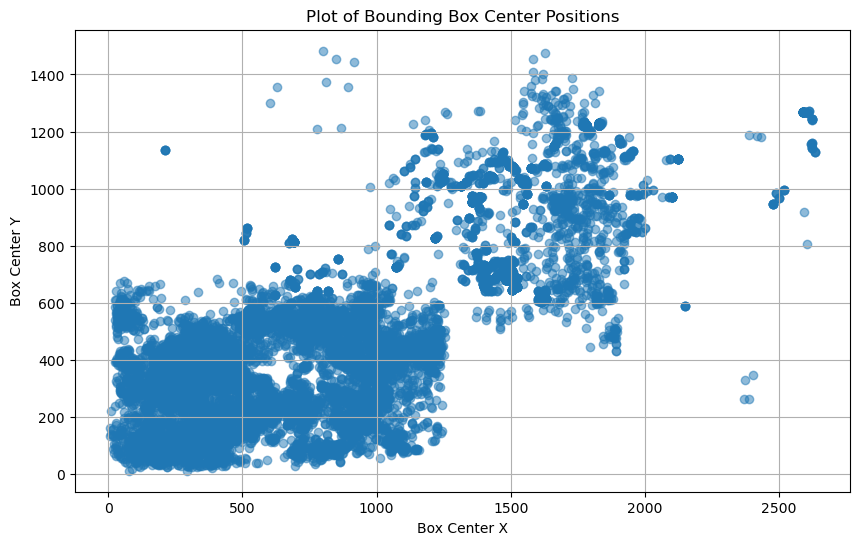

In [147]:
plt.figure(figsize=(10, 6))
plt.scatter(train_df['box_center_x'], train_df['box_center_y'], alpha=0.5)
plt.xlabel('Box Center X')
plt.ylabel('Box Center Y')
plt.title('Plot of Bounding Box Center Positions')
plt.grid(True)
plt.show()

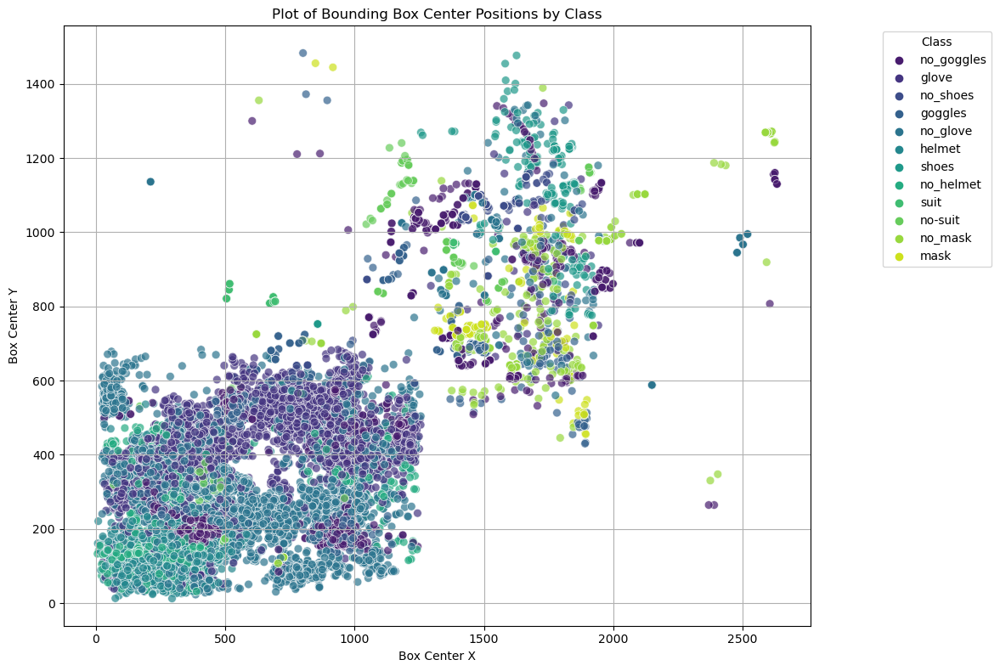

In [148]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x='box_center_x', y='box_center_y', hue='class', data=train_df, palette='viridis', alpha=0.7, s=50)
plt.xlabel('Box Center X')
plt.ylabel('Box Center Y')
plt.title('Plot of Bounding Box Center Positions by Class')
plt.grid(True)

plt.legend(title='Class', loc='upper right', bbox_to_anchor=(1.25, 1))

plt.tight_layout()
plt.show()

In [149]:
train_df['box_center_x'].describe()

count    19688.000000
mean       739.712363
std        483.313058
min          7.000000
25%        353.000000
50%        564.000000
75%        991.500000
max       2632.000000
Name: box_center_x, dtype: float64

In [150]:
train_df['box_center_y'].describe()

count    19688.000000
mean       431.971912
std        276.261321
min         12.500000
25%        229.000000
50%        388.000000
75%        538.500000
max       1483.000000
Name: box_center_y, dtype: float64

### Conclusion on Bounding Box Locations

The analysis of the bounding box locations offers valuable insights into object placements within the images in the dataset.

#### Bounding Box Center 
- The analysis of the X-coordinate centers of bounding boxes reveals a discernable pattern, suggesting prevalent horizontal clusters within the images. Similarly, the examination of the Y-coordinate centers unveils clustering, highlighting specific vertical areas where objects are generally located within the images.

The varied locations of the centers of bounding boxes signify that the dataset possesses objects distributed across different parts of the images. This diversity in object locations is beneficial as it can aid the model in learning to recognize and localize objects effectively regardless of their position within the image, thus enhancing the model's adaptability and performance in diverse real-world scenarios.

## Conclusion
#### Can a Model be Built with this Dataset?
Yes. The available dataset provides a substantial foundation to commence the model training process. However, addressing the imbalances inherent within the dataset is crucial before progressing. The implementation of data augmentation or undersampling should be contemplated, ensuring adaptations are made in sync with the bounding boxes. 

Moreover, uniformity in data dimensions is crucial. Hence, images exhibiting deviations in aspect ratios should either be resized or omitted to maintain consistency and avoid excessive distortions. While the majority of images contain a single object, a substantial number feature multiple objects, enriching the dataset’s diversity and enhancing its relevance to real-world scenarios. 

The variation in both the size and the location of the bounding boxes across images augments the comprehensive nature of the dataset. This diversity in object representations will facilitate the model in learning to effectively recognize and localize objects irrespective of their dimensions and positions within varying images, thereby contributing to the refinement of its adaptability and overall performance in diverse real-world scenarios.

However, the dataset is notably limited, and there exist instances of incomplete annotations. This entails that there are several instances within the dataset where objects that should be annotated are omitted. The inherent imbalance within the dataset is another critical concern, and the implementation of undersampling could significantly reduce the available data. Utmost caution must be exercised when performing data augmentation to preserve the integrity of bounding box annotations accurately.

These annotation lapses are substantial, potentially impeding the model’s ability to learn effectively and possibly causing it to miss similar objects during its predictions. The dataset would substantially benefit from a more diverse range of images, especially those housing more than one object per image and exhibiting varied object locations and bounding box sizes. A richer, more comprehensive dataset, potentially provided by R&D, would be pivotal in enhancing the model’s quality, enabling a more nuanced and robust learning process, and ultimately ensuring the model's heightened reliability and accuracy in diverse real-world scenarios.